# Case study: Oil example

At first, import all neccessary libraries

In [133]:
using CSV
using DataFrames
using Plots
using JuMP
using Gurobi
using Gogeta

The main idea behind this example is to show how neural networks as surrogate models can be used in larger optimization problems. Especially this example is intended to foster use of `NN_incorporate!()` function. This optimization problem has some non-linear constraints that can be modeled by NN.

## Problem statement

"An offshore production system consists of several interconnected modules with corresponding interde- pendencies. The reservoir is the subsurface structure where oil and gas are located prior to extraction. A number of wells are drilled into the reservoir. The flow coming from a well is a mixture of water, oil and gas, called production phases, and is routed to a platform through a network of pipelines. Manifolds are used to connect different pipelines and to mix the incoming flows. At the platform, separators split the production phases and route the resulting streams of oil and gas to an export line. The export lines lead production phases off-site. The production flow from a well may be routed to a subset of the separators on the platform. A well can only be routed to a single separator at any given time. The routing decision must take into consideration the interdependencies between wells which produce to the same separator."

This system is shown in the Figure 1 as a graph.

<center><img src="img/Screenshot 2024-08-26 at 00.55.56.png" height="300"></center>

Figure 1 – Production system flow graph, with nodes represented by gray circles and edges by arrows. Discrete edges are dashed. The nonlinearities $f_1$ and $g_{(9,11)}$, related to Node 1 and Edge (9,11), are shown.

$f$ and $g$ are non-linear functions, so they can't be used in liner optimization problem, but we can construct surragate models. We did simulations in advance, the simulated data is in the folder `data`. Lets have a look at fisrt at it

In [ ]:
plots = []

for w in 1:8
    
    oil_model = Model(Gurobi.Optimizer)
    set_silent(oil_model)
    @objective(oil_model, Max, 0)
    @variable(oil_model, p)
    @variable(oil_model, out)

    df = CSV.read("data/well_$w.csv", DataFrame)

    NN_incorporate!(oil_model, "models/NN_well_$w.json", out, p; U_in=maximum(df.PWH), L_in=minimum(df.PWH), silent=true)
    x_range = LinRange{Float32}(minimum(df.PWH), maximum(df.PWH), 50)
    plot(x_range, x -> -forward_pass_NN!(oil_model, x, out, p), label="NN", title="WELL $w", xlabel="pressure", ylabel="flow")

    push!(plots, scatter!(df.PWH, df.QOIL, label="Data"))

end

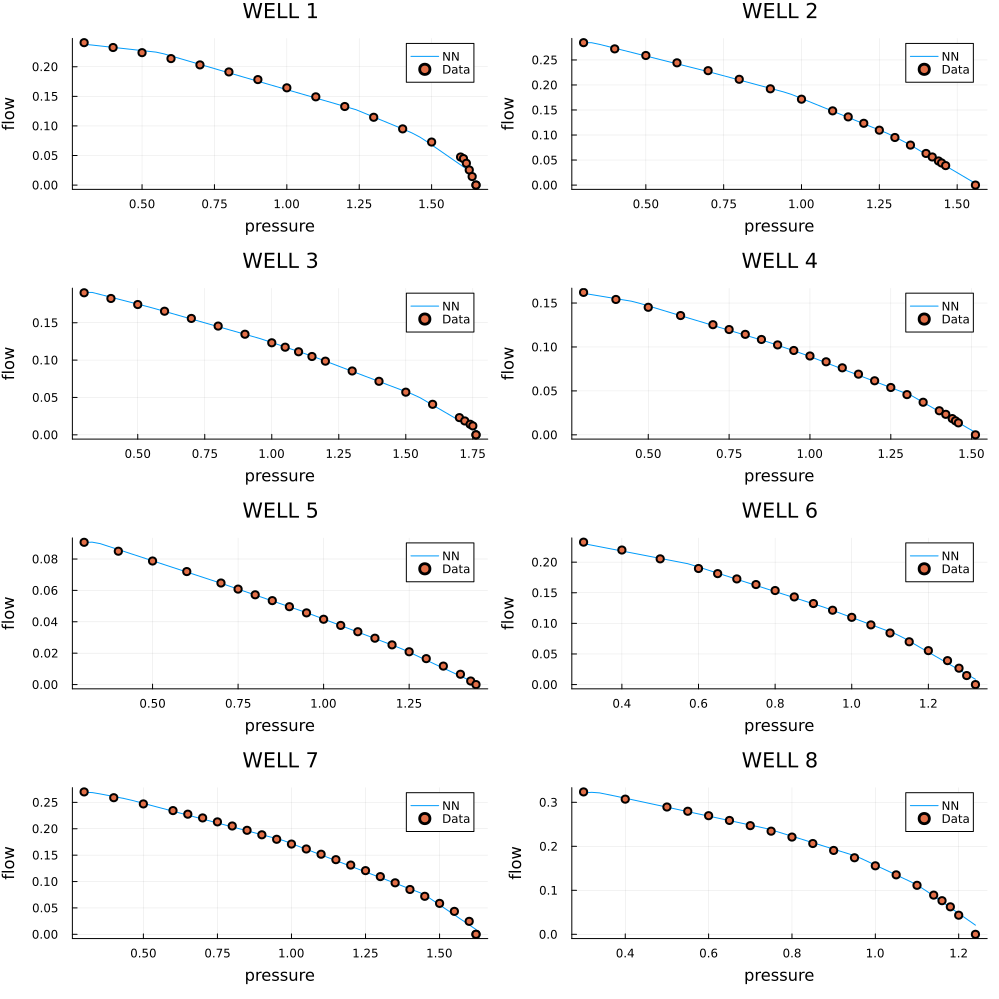

In [136]:
plot(plots..., layout=(4, 2), size=(1000, 1000))

As you can see function of flow versus pressure at each well was a non-linear function. We trained 8 neural networks using this data (the weights of trained models can be found in the folder `models`) and then used function `NN_incorporate!()` that you have already faced. 

This formulation allows us to work with variables as with anonimus ones. We create our selves the variables associated with input and output variables. In this case `p` was input variable and `out` is a output of the neural network.

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-20


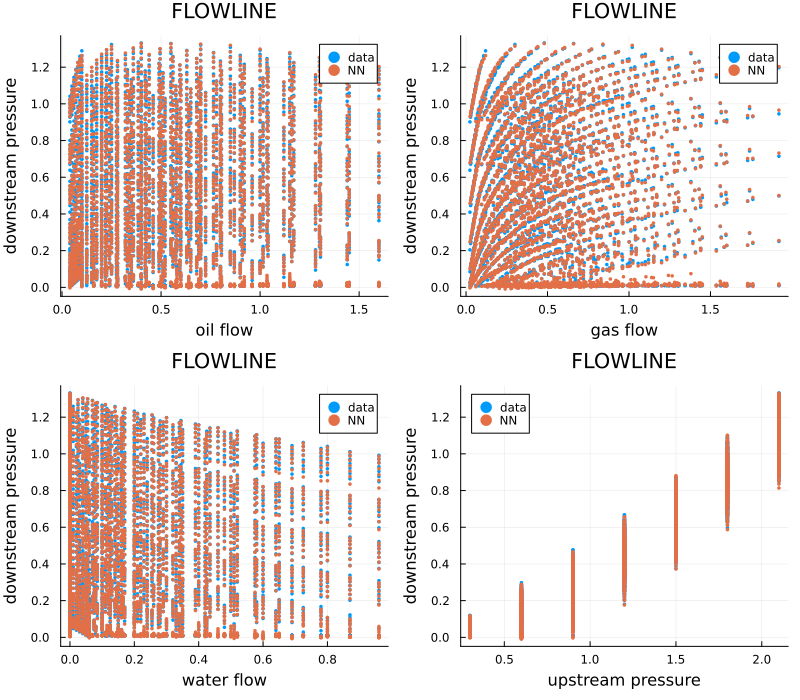

In [137]:
plots = []
df = CSV.read("data/flowline_1.csv", DataFrame)

oil_model = Model(Gurobi.Optimizer)
@objective(oil_model, Max, 0)
@variable(oil_model, qoil)
@variable(oil_model, qgas)
@variable(oil_model, qwater)
@variable(oil_model, pus)
@variable(oil_model, pds)
    
set_silent(oil_model)

NN_incorporate!(oil_model, "models/NN_flowline_1.json", pds, qoil, qgas, qwater, pus; U_in=[maximum(df.QOIL), maximum(df.QGAS), maximum(df.QWAT), maximum(df.PUS)], L_in=[minimum(df.QOIL), minimum(df.QGAS), minimum(df.QWAT), minimum(df.PUS)], silent = true)
pds = map(row -> forward_pass_NN!(oil_model, collect(row[2:end-1]), pds, qoil, qgas, qwater, pus), eachrow(df))


scatter(df.QOIL, df.PDS, markersize=2, markerstrokewidth=0, label="data", title="FLOWLINE", xlabel="oil flow", ylabel="downstream pressure")
push!(plots, scatter!(df.QOIL, pds, markersize=2, markerstrokewidth=0, label="NN"))

scatter(df.QGAS, df.PDS, markersize=2, markerstrokewidth=0, label="data", title="FLOWLINE", xlabel="gas flow", ylabel="downstream pressure")
push!(plots, scatter!(df.QGAS, pds, markersize=2, markerstrokewidth=0, label="NN"))

scatter(df.QWAT, df.PDS, markersize=2, markerstrokewidth=0, label="data", title="FLOWLINE", xlabel="water flow", ylabel="downstream pressure")
push!(plots, scatter!(df.QWAT, pds, markersize=2, markerstrokewidth=0, label="NN"))

scatter(df.PUS, df.PDS, markersize=2, markerstrokewidth=0, label="data", title="FLOWLINE", xlabel="upstream pressure", ylabel="downstream pressure")
push!(plots, scatter!(df.PUS, pds, markersize=2, markerstrokewidth=0, label="NN"))

plot(plots..., layout=(2, 2), size=(800, 700))

We also have data to model function $g$, calculates the pressure at the separator as
a function of the flow rates ($q_{e,oil}$,$q_{e,gas}$,$q_{e,wat}$) in the riser and the pressure at the start of the riser $p_i$, where $e$ is dashed edge. This function was also learned with a neural network and then formulated as MILP problem using anonimus functions.

There is a set of definitions that will be used to formulate a bigger optimization problem.

<center><img src="img/image.png" height="200"></center>

## Formulation of the optimization problem

At first lets innitialize all nodes in the production system

In [128]:
Nw = [i for i in 1:8]; # nodes for wells
Nm = [9, 10]; # nodes for manifolds
Ns = [11, 12]; # nodes for separators
N = union(Nw, Nm, Ns); # set of all nodes

Then, we create all edges between the nodes 

In [129]:
Ed = vec([(i, j) for i in 1:8, j in [9, 10]]); # all walls are connected to all manifolds
Er = [(9, 11), (10, 12)]; # manifold is connected only to separator
E = union(Ed, Er); # set of all edges

`Ein[i]` stores all edges by which we can get to node `i` and `Eout[i]` stores all edges that start with node `i`. We will need it later.

In [130]:
Ein = Vector{Vector}(undef, 12)
[Ein[i] = [] for i in 1:8]
Ein[9] = [(i, 9) for i in 1:8]
Ein[10] = [(i, 10) for i in 1:8]
Ein[11] = [(9, 11)]
Ein[12] = [(10, 12)]

Eout = Vector{Vector}(undef, 12)
[Eout[i] = [(i, 9), (i, 10)] for i in 1:8]
Eout[9] = [(9, 11)]
Eout[10] = [(10, 12)]
Eout[11] = []
Eout[12] = []

# phases of oil
C = [1, 2, 3]; # oil, gas, water

Each node in the production system has lower and upper bounds for preassure:
- `P_LIMS` stores pressure bounds in wells and manifolds
- `P_SEP` stores pressure in separator

`Q_[phase]` stores flow rate of oil in different phases (oil, gas, water). Each well also has gas-oil ratio, water-oil ratio and water-content.

In [132]:
### CONSTANTS ###

P_LIMS = [ # pressure limits for each node
    (0.3, 1.65329),
    (0.3, 1.55873),
    (0.3, 1.76193),
    (0.3, 1.51174),
    (0.3, 1.44545),
    (0.3, 1.32290),
    (0.3, 1.62300),
    (0.3, 1.24020),
    (0.299867, 2.09987),
    (0.299867, 2.09987),
    (0.005022, 1.33179),
    (0.005022, 1.33179),
]

Q_OIL = [ # oil flow bounds from the wells
    (0.0, 0.240734),
    (0.0, 0.284504),
    (0.0, 0.190091),
    (0.0, 0.162084),
    (0.0, 0.090637),
    (0.0, 0.232649),
    (0.0, 0.269781),
    (0.0, 0.323648),

]

P_SEP = [0.20, 0.30]; # separator pressures

Q_GAS = (0.0, 10.0) # gas flow bounds from the wells
# totally redundant because the GOR and WOR constraints lock the water and gas flow to the oil flow

Q_WATER = (0.0, 10.0) # water flow bounds from the wells
# totally redundant because the GOR and WOR constraints lock the water and gas flow to the oil flow

GOR = [1053.0, 805.0, 789.0, 790.0, 633.0, 745.0, 742.0, 759.0] .* 0.001 # gas-oil ratio

WCT = [12.7, 23.7, 41.7, 55.4, 54.81, 27.0, 0, 0] * 0.01 # water contents
WOR = map(wct -> wct/(1-wct), WCT); # water-oil ratio

The whole optimization problem looks like this:

<center><img src="img/Screenshot 2024-08-26 at 00.54.34.png" height="500"></center>

Explanation behind each constraint:

- The objective function (14a) maximizes the total oil production. 
- Constraints (14b) are mass balance constraints that make sure that the flow into a manifolds equals the flow out of it. 
- The riser pressure drop functions $g_e(q_{e,oil}, q_{e,gas}, q_{e,wat}, p_{i})$ for $e \in E_r$ in equation (14c) calculate the pressure at the separator as a function of the flow rates $(q_{e,oil},q_{e,gas},q_{e,wat})$ in the riser and the pressure at the start of the riser pi.
- We assume no pressure drop over the discrete edges $(e \in E_d)$ that are open ($y_e = 1$), as specified by the
big-M constraints in (14d). 
- Constraints (14e) state that the flow from a well can be routed through at most one pipeline, while constraints (14f) connect flow rate through a pipeline with the routing decision.
- The flow must be within upper and lower bounds if the pipeline is open, and zero otherwise. 
- The bounds on the pressure at each node are given by constraints (14g). 
- The well performance curves fi(pi) for i ∈ Nw in equation (14h) relate the pressure at well $i$, $p_i$, with the flow rate of oil out of the well $q_e$,oil for $e \in E_{out}$. Constraints (14i) and (14j) connect the flow rates of the different phases through the gas-oil $i$ and water-oil ratios. 
- The pressure at the separators is fixed through constraints (14k) and constraints (14l) define the binary variables.

Lets start creating the `JuMP` model from the easiest parts.

In [ ]:
oil_model = Model(Gurobi.Optimizer)
set_silent(oil_model)

@variable(oil_model, p[N]);
@variable(oil_model, q[E, C]);
@variable(oil_model, y[Ed], Bin) 

# 14a
@objective(oil_model, Max, sum([q[e, 1] for e in Er]));

We innitialize a `JuMP` model as a function of `p` (preassure) `q`(flow) and `y`(depics if edge is in use, binary) variables. The objective function is to maximize oil content at the separators. 

- `p[N]` - at each node in the graph there is a preassure
- `q[E,C]` - at each edge there is a flow of different phase of oil (oil, gas, water)
- `q[e, 1] for e in Er]` - for each `e` in `Er` (connections between manifolds and separators),  1 is "oil" (look at variable `C`)


Formulate all linear constraints:

In [ ]:
# 14b
@constraint(oil_model, [c=C, i=Nm], sum([q[e, c] for e in Ein[i]]) == sum([q[e, c] for e in Eout[i]]));

# 14d
@constraint(oil_model, [e=Ed], p[e[1]] - p[e[2]] <= (P_LIMS[e[1]][2] - P_LIMS[e[2]][1]) * (1 - y[e]));
@constraint(oil_model, [e=Ed], (-P_LIMS[e[2]][2] + P_LIMS[e[1]][1]) * (1 - y[e]) <= p[e[1]] - p[e[2]]);

# 14e
@constraint(oil_model, [i=Nw], sum([y[e] for e in Eout[i]]) <= 1);

# 14f
@constraint(oil_model, [e=Ed], y[e] * Q_OIL[e[1]][1] <= q[e, 1]);
@constraint(oil_model, [e=Ed], q[e, 1] <= y[e] * Q_OIL[e[1]][2]);

# gas
@constraint(oil_model, [e=Ed], y[e] * Q_GAS[1] <= q[e, 2]);
@constraint(oil_model, [e=Ed], q[e, 2] <= y[e] * Q_GAS[2]);

# water
@constraint(oil_model, [e=Ed], y[e] * Q_WATER[1] <= q[e, 3]);
@constraint(oil_model, [e=Ed], q[e, 3] <= y[e] * Q_WATER[2]);

# 14g pressure limits at each node
@constraint(oil_model, [i=N], P_LIMS[i][1] <= p[i] <= P_LIMS[i][2]);

# 14i
@constraint(oil_model, [i=Nw], sum([q[e, 2] for e in Eout[i]]) == GOR[i] * sum([q[e, 1] for e in Eout[i]]));

# 14j
@constraint(oil_model, [i=Nw], sum([q[e, 3] for e in Eout[i]]) == WOR[i] * sum([q[e, 1] for e in Eout[i]]));

# 14k
@constraint(oil_model, [i=Ns], p[i] == P_SEP[i-10]);

To model first non-linear function. We create 2 variables `g[e=Er]` that represent downstream preassure at each separator. With function `NN_incorporate!()` we can model it as MILP. Remember to provide the variables in the correct order: output of the neural net and input variables (in the same order as neural network was trained). Add constrain 14c

In [117]:
# 14c
@variable(oil_model, g[e=Er]);
[NN_incorporate!(oil_model, "models/NN_flowline_1_small.json", g[e], q[e, 1], q[e, 2], q[e, 3], p[e[1]]; U_in=[1.8, 1.92, 0.96, 2.09987], L_in=[0.0, 0.024, 0.0, 0.299867], silent=true) for e in Er] # these bounds are from the dataset that was used to train the flowline models
@constraint(oil_model, [e in Er], p[e[2]] == g[e]);

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-20


In the similar manner, for each well node, model $f_i$ function and add constraints 14h

In [ ]:
# 14h
@variable(oil_model, f[i=Nw]);
[NN_incorporate!(oil_model, "models/NN_well_$i.json", f[i], p[i]; U_in=P_LIMS[i][2], L_in=P_LIMS[i][1], silent=true) for i in Nw];
@constraint(oil_model, [i=Nw], sum([q[e, 1] for e in Eout[i]]) == -f[i]);

## Optimization

The whole optimization problem can be summorized as:

In [141]:
oil_model = Model(Gurobi.Optimizer)
set_silent(oil_model)

@variable(oil_model, p[N]);
@variable(oil_model, q[E, C]);
@variable(oil_model, y[Ed], Bin) 

# 14a
@objective(oil_model, Max, sum([q[e, 1] for e in Er]));

# 14b
@constraint(oil_model, [c=C, i=Nm], sum([q[e, c] for e in Ein[i]]) == sum([q[e, c] for e in Eout[i]]));

# 14c
@variable(oil_model, g[e=Er]);
[NN_incorporate!(oil_model, "models/NN_flowline_1_small.json", g[e], q[e, 1], q[e, 2], q[e, 3], p[e[1]]; U_in=[1.8, 1.92, 0.96, 2.09987], L_in=[0.0, 0.024, 0.0, 0.299867], silent=true) for e in Er] # these bounds are from the dataset that was used to train the flowline models
@constraint(oil_model, [e in Er], p[e[2]] == g[e]);

# 14d
@constraint(oil_model, [e=Ed], p[e[1]] - p[e[2]] <= (P_LIMS[e[1]][2] - P_LIMS[e[2]][1]) * (1 - y[e]));
@constraint(oil_model, [e=Ed], (-P_LIMS[e[2]][2] + P_LIMS[e[1]][1]) * (1 - y[e]) <= p[e[1]] - p[e[2]]);

# 14e
@constraint(oil_model, [i=Nw], sum([y[e] for e in Eout[i]]) <= 1);

# 14f
@constraint(oil_model, [e=Ed], y[e] * Q_OIL[e[1]][1] <= q[e, 1]);
@constraint(oil_model, [e=Ed], q[e, 1] <= y[e] * Q_OIL[e[1]][2]);

# gas
@constraint(oil_model, [e=Ed], y[e] * Q_GAS[1] <= q[e, 2]);
@constraint(oil_model, [e=Ed], q[e, 2] <= y[e] * Q_GAS[2]);

# water
@constraint(oil_model, [e=Ed], y[e] * Q_WATER[1] <= q[e, 3]);
@constraint(oil_model, [e=Ed], q[e, 3] <= y[e] * Q_WATER[2]);

# 14g pressure limits at each node
@constraint(oil_model, [i=N], P_LIMS[i][1] <= p[i] <= P_LIMS[i][2]);

# 14h
@variable(oil_model, f[i=Nw]);
[NN_incorporate!(oil_model, "models/NN_well_$i.json", f[i], p[i]; U_in=P_LIMS[i][2], L_in=P_LIMS[i][1], silent=true) for i in Nw];
@constraint(oil_model, [i=Nw], sum([q[e, 1] for e in Eout[i]]) == -f[i]);

# 14i
@constraint(oil_model, [i=Nw], sum([q[e, 2] for e in Eout[i]]) == GOR[i] * sum([q[e, 1] for e in Eout[i]]));

# 14j
@constraint(oil_model, [i=Nw], sum([q[e, 3] for e in Eout[i]]) == WOR[i] * sum([q[e, 1] for e in Eout[i]]));

# 14k
@constraint(oil_model, [i=Ns], p[i] == P_SEP[i-10]);

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-20


In [148]:
### SOLUTION ###
optimize!(oil_model)

println("The maximum total oil production is ", objective_value(oil_model))

The maximum total oil production is 1.307039304530662


The flow from well nodes to manifolds

In [163]:
column_names = ["`Connection", "Flow of oil", "Flow of gas", "Flow of water"]
df = DataFrame([Ed value.(q[Ed, :])], Symbol.(column_names))
df

Row,`Connection,Flow of oil,Flow of gas,Flow of water
,Any,Any,Any,Any
1,"(1, 9)",0.0,0.0,0.0
2,"(2, 9)",0.221606,0.178393,0.0688343
3,"(3, 9)",0.0,0.0,0.0
4,"(4, 9)",0.0,0.0,0.0
5,"(5, 9)",0.0,0.0,0.0
6,"(6, 9)",0.165899,0.123595,0.06136
7,"(7, 9)",0.213871,0.158692,0.0
8,"(8, 9)",0.24216,0.183799,0.0
9,"(1, 10)",0.176136,0.185471,0.0256234


The flow from manifolds to separators

In [164]:
column_names = ["`Connection", "Flow of oil", "Flow of gas", "Flow of water"]
df = DataFrame([Er value.(q[Er, :])], Symbol.(column_names))
df

Row,`Connection,Flow of oil,Flow of gas,Flow of water
,Any,Any,Any,Any
1,"(9, 11)",0.843535,0.644479,0.130194
2,"(10, 12)",0.463504,0.404527,0.309996


In [144]:
oil_model

A JuMP Model
Maximization problem with:
Variables: 1138
Objective function type: AffExpr
`AffExpr`-in-`MathOptInterface.EqualTo{Float64}`: 410 constraints
`AffExpr`-in-`MathOptInterface.GreaterThan{Float64}`: 680 constraints
`AffExpr`-in-`MathOptInterface.LessThan{Float64}`: 816 constraints
`AffExpr`-in-`MathOptInterface.Interval{Float64}`: 28 constraints
`VariableRef`-in-`MathOptInterface.ZeroOne`: 356 constraints
Model mode: AUTOMATIC
CachingOptimizer state: ATTACHED_OPTIMIZER
Solver name: Gurobi
Names registered in the model: f, g, p, q, y

In [145]:
solution_summary(oil_model)

* Solver : Gurobi

* Status
  Result count       : 5
  Termination status : OPTIMAL
  Message from the solver:
  "Model was solved to optimality (subject to tolerances), and an optimal solution is available."

* Candidate solution (result #1)
  Primal status      : FEASIBLE_POINT
  Dual status        : NO_SOLUTION
  Objective value    : 1.30704e+00
  Objective bound    : 1.30704e+00
  Relative gap       : 0.00000e+00
  Dual objective value : 1.30704e+00

* Work counters
  Solve time (sec)   : 1.56307e-03
  Barrier iterations : 0
  Node count         : 1251
